In [1]:
!pip install -q medmnist
!pip install -q grad-cam
!pip install -q medimeta

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter, defaultdict
from pathlib import Path

from medmnist import INFO
from medmnist import DermaMNIST

import torch
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import DataLoader
from medmnist import DermaMNIST

import importlib
import helpers as h
importlib.reload(h)

Using device: cuda
Using device: cuda


<module 'helpers' from '/content/helpers.py'>

In [4]:
# set seed
SEED = 912742984

torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
np.random.seed(SEED)

# Data Exploration

In [5]:
data_set = "dermamnist"
download = True
IMG_SIZES = (64, 128)
SPLITS = ['train', 'val', 'test']
RESNETS = (18, 50)

info = INFO[data_set]
task = info["task"] 
n_channels = info["n_channels"]
n_classes = len(info["label"])  
class_names = h.get_class_names(info)
print(f"Task: {task}, Channels: {n_channels}, Number of classes: {n_classes}")

datasets = defaultdict(dict)
for size in IMG_SIZES:
    print(f"{size} x {size}")
    for split in SPLITS:
        dataset = DermaMNIST(split=split, download=True, size=size)
        datasets[size][split] = dataset

        print(f"Number of {split} images: {len(dataset)}")

Task: multi-class, Channels: 3, Number of classes: 7
64 x 64
Number of train images: 7007
Number of val images: 1003
Number of test images: 2005
128 x 128
Number of train images: 7007
Number of val images: 1003
Number of test images: 2005


In [6]:
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"Using device: {device}")

Using device: cuda


In [7]:
dfs = []
for size in IMG_SIZES:
    dataset_lst = [datasets[size][split] for split in SPLITS]
    dfs.append(h.count_datasets(dataset_lst, info, n_classes))

for df in dfs:
    display(df)

[train] number of images per class:
-----
actinic keratoses and intraepithelial carcinoma: 228
basal cell carcinoma: 359
benign keratosis-like lesions: 769
dermatofibroma: 80
melanoma: 779
melanocytic nevi: 4693
vascular lesions: 99
-----
[validation] number of images per class:
-----
actinic keratoses and intraepithelial carcinoma: 33
basal cell carcinoma: 52
benign keratosis-like lesions: 110
dermatofibroma: 12
melanoma: 111
melanocytic nevi: 671
vascular lesions: 14
-----
[test] number of images per class:
-----
actinic keratoses and intraepithelial carcinoma: 66
basal cell carcinoma: 103
benign keratosis-like lesions: 220
dermatofibroma: 23
melanoma: 223
melanocytic nevi: 1341
vascular lesions: 29
-----
[total] number and proportions of images per class:
-----
actinic keratoses and intraepithelial carcinoma: 327 (3.27%)
basal cell carcinoma: 514 (5.13%)
benign keratosis-like lesions: 1099 (10.97%)
dermatofibroma: 115 (1.15%)
melanoma: 1113 (11.11%)
melanocytic nevi: 6705 (66.95%)
v

,class,train,validation,test,total,proportion
0,actinic keratoses and intraepithelial carcinoma,228,33,66,327,0.032651
1,basal cell carcinoma,359,52,103,514,0.051323
2,benign keratosis-like lesions,769,110,220,1099,0.109735
3,dermatofibroma,80,12,23,115,0.011483
4,melanoma,779,111,223,1113,0.111133
5,melanocytic nevi,4693,671,1341,6705,0.669496
6,vascular lesions,99,14,29,142,0.014179


,class,train,validation,test,total,proportion
0,actinic keratoses and intraepithelial carcinoma,228,33,66,327,0.032651
1,basal cell carcinoma,359,52,103,514,0.051323
2,benign keratosis-like lesions,769,110,220,1099,0.109735
3,dermatofibroma,80,12,23,115,0.011483
4,melanoma,779,111,223,1113,0.111133
5,melanocytic nevi,4693,671,1341,6705,0.669496
6,vascular lesions,99,14,29,142,0.014179


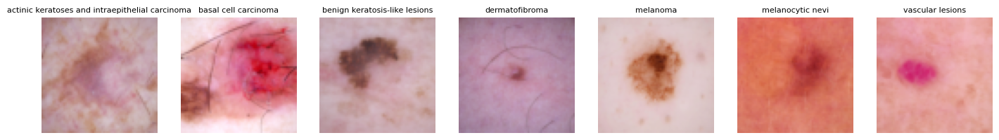

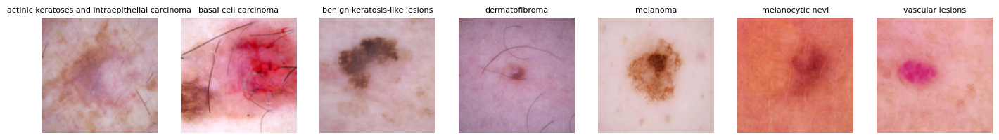

In [8]:
for size in IMG_SIZES:
    h.show_one_per_class(datasets[size]['train'], class_names)

In [7]:
# data imbalanced, nevi dominate with small counts for other classes
# benign classes: nevi, benign keratosis, dermatofibroma, vascular lesions
# malignant classes: melanoma, basal cell carcinoma
# pre-malignant / early stage: actinic keratoses and intraepithelial carcinoma

# Model Training

In [9]:
for size in IMG_SIZES:
    img, label = datasets[size]['train'][0]
    print(np.array(img).shape)
    print(info['n_channels'])

(64, 64, 3)
3
(128, 128, 3)
3


In [10]:
train_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3),
])

test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3),
])


In [11]:
# apply transformations to datasets
datasets_tr = defaultdict(dict)
for size in IMG_SIZES:
    for split in SPLITS:
        datasets_tr[size][split] = DermaMNIST(
            split=split,
            transform=train_transform if split == 'train' else test_transform,   
            download=True,
            size=size
        )

# set up dataloaders
dataloaders = defaultdict(dict)
for size in IMG_SIZES:
    for split in SPLITS:
        dataloaders[size][split] = DataLoader(datasets_tr[size][split], batch_size=64, shuffle=True if split == 'train' else False)

In [12]:
# set up external validation dataset and loaders
ext_val_datasets = {}
ext_val_dataloaders = {}
for size in IMG_SIZES:
    # dataset
    ext_dataset = h.TransformedMedIMeta(
        "drive/MyDrive/School/Harvard/bmi712/project/MedIMeta", 
        "derm", 
        "disease category", 
        transform=transforms.Compose([
            transforms.Resize((size, size)),
            transforms.Normalize(mean=[0.5]*3, std=[0.5]*3),
        ]),
    )
    ext_val_datasets[size] = ext_dataset

    # dataloader
    ext_val_dataloaders[size] = DataLoader(ext_dataset, batch_size=64, shuffle=False)

In [13]:
# set up loss function for weighted classes
# since both datasets have same counts of labels, can use same weights
train_labels = [int(label[0]) for _, label in datasets_tr[64]['train']]
class_counts = np.bincount(train_labels)

print("Class counts:", class_counts)

class_weights = 1.0 / torch.tensor(class_counts, dtype=torch.float)
class_weights = class_weights / class_weights.sum() * len(class_counts)

print("Class weights:", class_weights)

weighted_criterion = nn.CrossEntropyLoss(weight=class_weights.to(device))
criterion = nn.CrossEntropyLoss()

criteria = {'unweighted': criterion, 'weighted': weighted_criterion}

Class counts: [ 228  359  769   80  779 4693   99]
Class weights: tensor([0.9426, 0.5987, 0.2795, 2.6865, 0.2759, 0.0458, 2.1709])


## ResNet (no attention)

In [14]:
out_metrics = defaultdict(list)
for size in IMG_SIZES:
    print(f"{size} x {size}")
    for name, criterion in criteria.items():
        print(f"Loss: {name}")
        for resnet_num in RESNETS:
            print(f"ResNet{resnet_num}")

            resnet = h.get_resnet(resnet_num)
            resnet = h.train_model(resnet, dataloaders[size]['train'], dataloaders[size]['val'], epochs=5, criterion=criterion)

            test_acc = h.evaluate(resnet, dataloaders[size]['test'])
            # print(f"Test accuracy: {test_acc:.4f}")

            val_auc = h.compute_auc(resnet, dataloaders[size]['val'], split='val', size=size)
            test_auc = h.compute_auc(resnet, dataloaders[size]['test'], split='test', size=size)

            ext_val_auc = h.compute_auc_multiclass(resnet, ext_val_dataloaders[size])
            ext_val_acc = h.evaluate(resnet, ext_val_dataloaders[size])

            out_metrics['img_size'].append(size)
            out_metrics['loss_func'].append(name)
            out_metrics['resnet'].append(f"ResNet{resnet_num}")
            out_metrics['val_auc'].append(val_auc[0])
            out_metrics['val_acc'].append(val_auc[1])
            out_metrics['test_auc'].append(test_auc[0])
            out_metrics['test_acc'].append(test_acc)
            out_metrics['ext_val_auc'].append(ext_val_auc)
            out_metrics['ext_val_acc'].append(ext_val_acc)
            out_metrics['model_obj'].append(resnet)

out_metrics_df = pd.DataFrame(out_metrics)
display(out_metrics_df)

64 x 64
Loss: unweighted
ResNet18
Epoch 1/5 | Loss: 91.9131 | Val Acc: 0.7607
Epoch 2/5 | Loss: 74.8832 | Val Acc: 0.7129
Epoch 3/5 | Loss: 73.0796 | Val Acc: 0.7547
Epoch 4/5 | Loss: 69.6107 | Val Acc: 0.7777
Epoch 5/5 | Loss: 65.9678 | Val Acc: 0.7577
ResNet50
Epoch 1/5 | Loss: 93.8212 | Val Acc: 0.7438
Epoch 2/5 | Loss: 77.2205 | Val Acc: 0.7159
Epoch 3/5 | Loss: 75.3444 | Val Acc: 0.7647
Epoch 4/5 | Loss: 69.2194 | Val Acc: 0.7697
Epoch 5/5 | Loss: 67.2198 | Val Acc: 0.7787
Loss: weighted
ResNet18
Epoch 1/5 | Loss: 168.9641 | Val Acc: 0.5025
Epoch 2/5 | Loss: 137.1242 | Val Acc: 0.6500
Epoch 3/5 | Loss: 132.5400 | Val Acc: 0.5474
Epoch 4/5 | Loss: 129.8604 | Val Acc: 0.5573
Epoch 5/5 | Loss: 117.7825 | Val Acc: 0.3470
ResNet50
Epoch 1/5 | Loss: 213.4199 | Val Acc: 0.5653
Epoch 2/5 | Loss: 196.9534 | Val Acc: 0.4596
Epoch 3/5 | Loss: 158.7575 | Val Acc: 0.5204
Epoch 4/5 | Loss: 147.2585 | Val Acc: 0.5503
Epoch 5/5 | Loss: 133.7254 | Val Acc: 0.5693
128 x 128
Loss: unweighted
ResNet1

,img_size,loss_func,resnet,val_auc,val_acc,test_auc,test_acc,ext_val_auc,ext_val_acc,model_obj
0,64,unweighted,ResNet18,0.935510,0.757727,0.932793,0.761596,0.620641,0.057082,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=..."
1,64,unweighted,ResNet50,0.941750,0.778664,0.936212,0.774564,0.626530,0.078925,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=..."
2,64,weighted,ResNet18,0.835563,0.346959,0.824793,0.351621,0.613621,0.043003,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=..."
3,64,weighted,ResNet50,0.894997,0.569292,0.896555,0.572569,0.631161,0.032253,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=..."
4,128,unweighted,ResNet18,0.943869,0.797607,0.952220,0.786534,0.637691,0.109898,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=..."
5,128,unweighted,ResNet50,0.891235,0.708873,0.889961,0.700748,0.595990,0.035410,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=..."
6,128,weighted,ResNet18,0.926620,0.700897,0.925825,0.694763,0.616521,0.043345,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=..."
7,128,weighted,ResNet50,0.898776,0.563310,0.890339,0.565586,0.577806,0.093771,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=..."


## ResNet (attention)

In [15]:
out_metrics_cbam = defaultdict(list)
learning_rates = (1e-3, 1e-4)
for size in IMG_SIZES:
    print(f"{size} x {size}")
    for name, criterion in criteria.items():
        print(f"Loss: {name}")
        for resnet_num in RESNETS:
            print(f"ResNet{resnet}")
            for lr in learning_rates:
                print(f"LR: {lr}")

                resnet_cbam = h.ResNet_CBAM(f"resnet{resnet_num}", n_classes).to(device)
                resnet_cbam = h.train_model(resnet_cbam, dataloaders[size]['train'], dataloaders[size]['val'], epochs=5, criterion=criterion, lr=lr)

                test_acc_cbam = h.evaluate(resnet_cbam, dataloaders[size]['test'])

                val_auc_cbam = h.compute_auc(resnet_cbam, dataloaders[size]['val'], split='val', size=size)
                test_auc_cbam = h.compute_auc(resnet_cbam, dataloaders[size]['test'], split='test', size=size)

                ext_val_auc_cbam = h.compute_auc_multiclass(resnet_cbam, ext_val_dataloaders[size])
                ext_val_acc_cbam = h.evaluate(resnet_cbam, ext_val_dataloaders[size])

                out_metrics_cbam['img_size'].append(size)
                out_metrics_cbam['loss_func'].append(name)
                out_metrics_cbam['resnet'].append(f"ResNet{resnet_num}")
                out_metrics_cbam['learning_rate'].append(lr)
                out_metrics_cbam['test_acc'].append(test_acc_cbam)
                out_metrics_cbam['val_auc'].append(val_auc_cbam[0])
                out_metrics_cbam['val_acc'].append(val_auc_cbam[1])
                out_metrics_cbam['test_auc'].append(test_auc_cbam[0])
                out_metrics_cbam['ext_val_auc'].append(ext_val_auc_cbam)
                out_metrics_cbam['ext_val_acc'].append(ext_val_acc_cbam)
                out_metrics_cbam['model_obj'].append(resnet_cbam)

out_metrics_cbam = pd.DataFrame(out_metrics_cbam)
display(out_metrics_cbam)

64 x 64
Loss: unweighted
ResNetResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, 

,img_size,loss_func,resnet,learning_rate,test_acc,val_auc,val_acc,test_auc,ext_val_auc,ext_val_acc,model_obj
0,64,unweighted,ResNet18,0.0010,0.757606,0.939556,0.746760,0.938379,0.633241,0.115785,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
1,64,unweighted,ResNet18,0.0001,0.797007,0.945850,0.782652,0.942178,0.526203,0.028242,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
2,64,unweighted,ResNet50,0.0010,0.713217,0.877760,0.722832,0.862029,0.614224,0.100000,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
3,64,unweighted,ResNet50,0.0001,0.805486,0.956856,0.811565,0.955417,0.600008,0.024829,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
4,64,weighted,ResNet18,0.0010,0.659850,0.912815,0.658026,0.917683,0.614953,0.057253,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
5,64,weighted,ResNet18,0.0001,0.684289,0.929446,0.669990,0.925639,0.582365,0.089078,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
6,64,weighted,ResNet50,0.0010,0.626434,0.908050,0.613161,0.910326,0.578182,0.022355,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
7,64,weighted,ResNet50,0.0001,0.687781,0.924001,0.663011,0.931295,0.615748,0.090700,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
8,128,unweighted,ResNet18,0.0010,0.764090,0.938053,0.757727,0.940463,0.585525,0.112031,ResNet_CBAM(\n (backbone): ResNet(\n (conv...
9,128,unweighted,ResNet18,0.0001,0.831421,0.955532,0.819541,0.961917,0.606321,0.061092,ResNet_CBAM(\n (backbone): ResNet(\n (conv...


In [20]:
# AI Usage: asked AI how to save the model
from pathlib import Path
out_metrics_df['attention'] = False
out_metrics_cbam['attention'] = True
all_results = pd.concat([out_metrics_df, out_metrics_cbam], axis=0, ignore_index=True)
display(all_results)

,img_size,loss_func,resnet,val_auc,val_acc,test_auc,test_acc,ext_val_auc,ext_val_acc,model_obj,attention,learning_rate
0,64,unweighted,ResNet18,0.935510,0.757727,0.932793,0.761596,0.620641,0.057082,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",False,NaN
1,64,unweighted,ResNet50,0.941750,0.778664,0.936212,0.774564,0.626530,0.078925,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",False,NaN
2,64,weighted,ResNet18,0.835563,0.346959,0.824793,0.351621,0.613621,0.043003,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",False,NaN
3,64,weighted,ResNet50,0.894997,0.569292,0.896555,0.572569,0.631161,0.032253,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",False,NaN
4,128,unweighted,ResNet18,0.943869,0.797607,0.952220,0.786534,0.637691,0.109898,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",False,NaN
5,128,unweighted,ResNet50,0.891235,0.708873,0.889961,0.700748,0.595990,0.035410,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",False,NaN
6,128,weighted,ResNet18,0.926620,0.700897,0.925825,0.694763,0.616521,0.043345,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",False,NaN
7,128,weighted,ResNet50,0.898776,0.563310,0.890339,0.565586,0.577806,0.093771,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",False,NaN
8,64,unweighted,ResNet18,0.939556,0.746760,0.938379,0.757606,0.633241,0.115785,ResNet_CBAM(\n (backbone): ResNet(\n (conv...,True,0.0010
9,64,unweighted,ResNet18,0.945850,0.782652,0.942178,0.797007,0.526203,0.028242,ResNet_CBAM(\n (backbone): ResNet(\n (conv...,True,0.0001


In [19]:
model_dir = Path.cwd() / 'drive/MyDrive/School/Harvard/bmi712/project/models'
model_dir.mkdir(parents=True, exist_ok=True)

for row in all_results.itertuples():
    filename = f"{row.img_size}_{row.loss_func}_{row.resnet}_{row.learning_rate}_model.pth"
    torch.save(row.model_obj.state_dict(), model_dir / filename)

all_results.drop('model_obj', axis=1, errors='raise').to_csv("drive/MyDrive/School/Harvard/bmi712/project/all_results.csv", index=False)

In [28]:
# show top 10 models by AUC, then by accuracy
all_results.sort_values(by=['val_auc', 'val_acc'], ascending=False)

,img_size,loss_func,resnet,val_auc,val_acc,test_auc,test_acc,ext_val_auc,ext_val_acc,model_obj,attention,learning_rate
19,128,unweighted,ResNet50,0.963120,0.831505,0.967518,0.831421,0.643995,0.082935,ResNet_CBAM(\n (backbone): ResNet(\n (conv...,True,0.0001
11,64,unweighted,ResNet50,0.956856,0.811565,0.955417,0.805486,0.600008,0.024829,ResNet_CBAM(\n (backbone): ResNet(\n (conv...,True,0.0001
17,128,unweighted,ResNet18,0.955532,0.819541,0.961917,0.831421,0.606321,0.061092,ResNet_CBAM(\n (backbone): ResNet(\n (conv...,True,0.0001
23,128,weighted,ResNet50,0.955521,0.752742,0.956636,0.768080,0.604967,0.038567,ResNet_CBAM(\n (backbone): ResNet(\n (conv...,True,0.0001
21,128,weighted,ResNet18,0.948399,0.729811,0.953955,0.747132,0.609203,0.068686,ResNet_CBAM(\n (backbone): ResNet(\n (conv...,True,0.0001
9,64,unweighted,ResNet18,0.945850,0.782652,0.942178,0.797007,0.526203,0.028242,ResNet_CBAM(\n (backbone): ResNet(\n (conv...,True,0.0001
4,128,unweighted,ResNet18,0.943869,0.797607,0.952220,0.786534,0.637691,0.109898,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",False,NaN
1,64,unweighted,ResNet50,0.941750,0.778664,0.936212,0.774564,0.626530,0.078925,"ResNet(\n (conv1): Conv2d(3, 64, kernel_size=...",False,NaN
8,64,unweighted,ResNet18,0.939556,0.746760,0.938379,0.757606,0.633241,0.115785,ResNet_CBAM(\n (backbone): ResNet(\n (conv...,True,0.0010
16,128,unweighted,ResNet18,0.938053,0.757727,0.940463,0.764090,0.585525,0.112031,ResNet_CBAM(\n (backbone): ResNet(\n (conv...,True,0.0010


# GradCAM

64, unweighted, ResNet18, nan


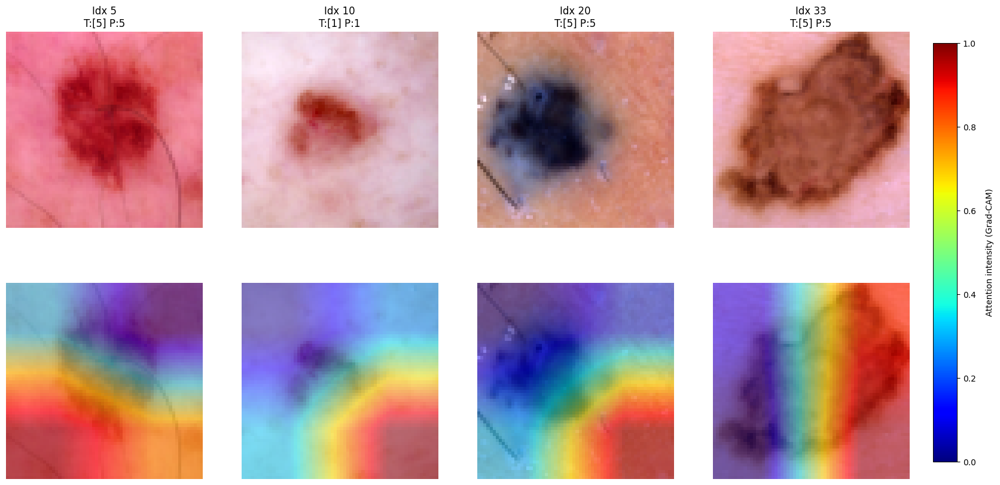

64, unweighted, ResNet50, nan


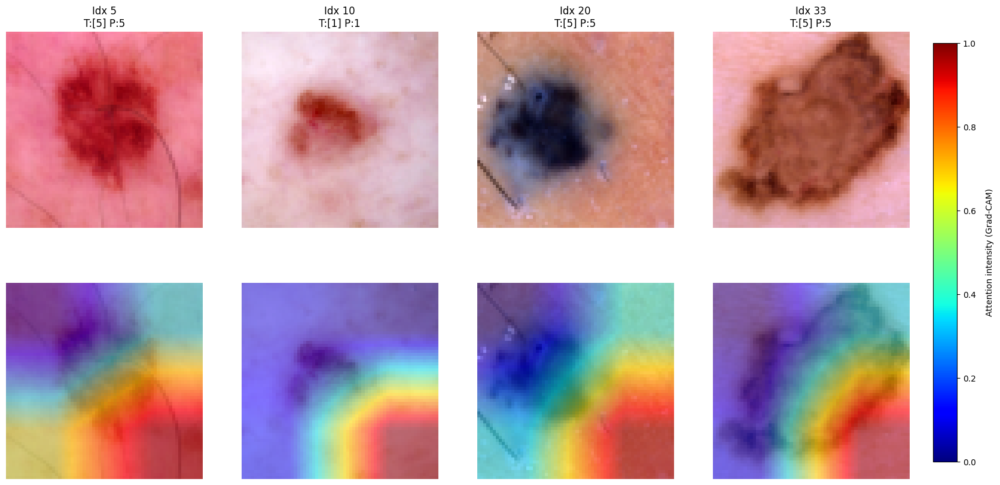

64, weighted, ResNet18, nan


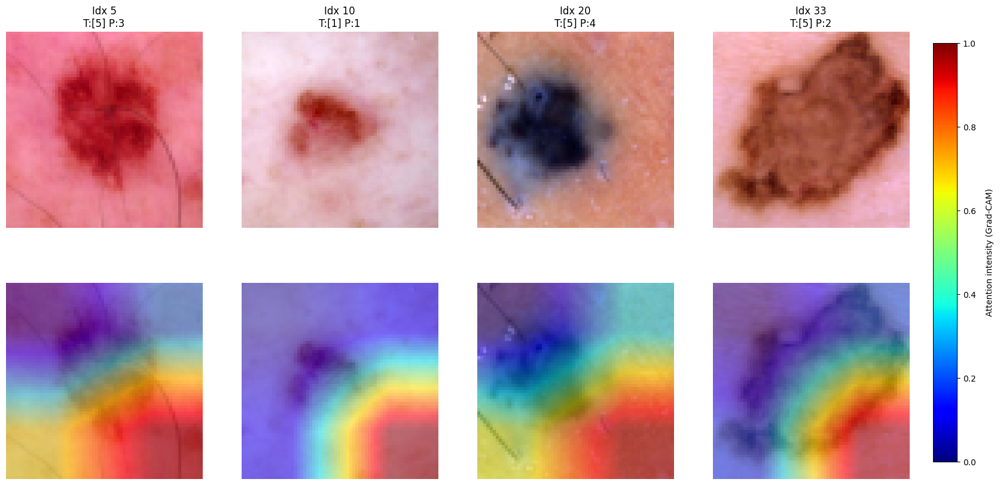

64, weighted, ResNet50, nan


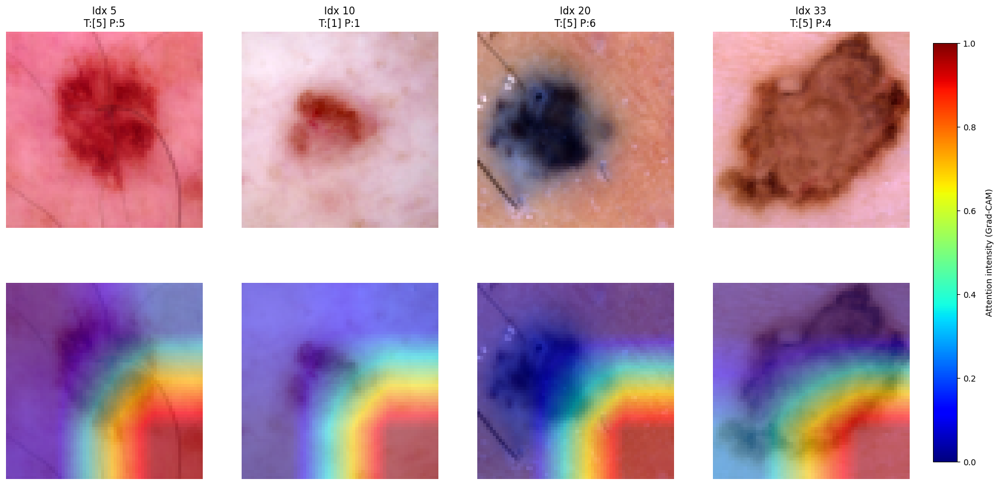

128, unweighted, ResNet18, nan


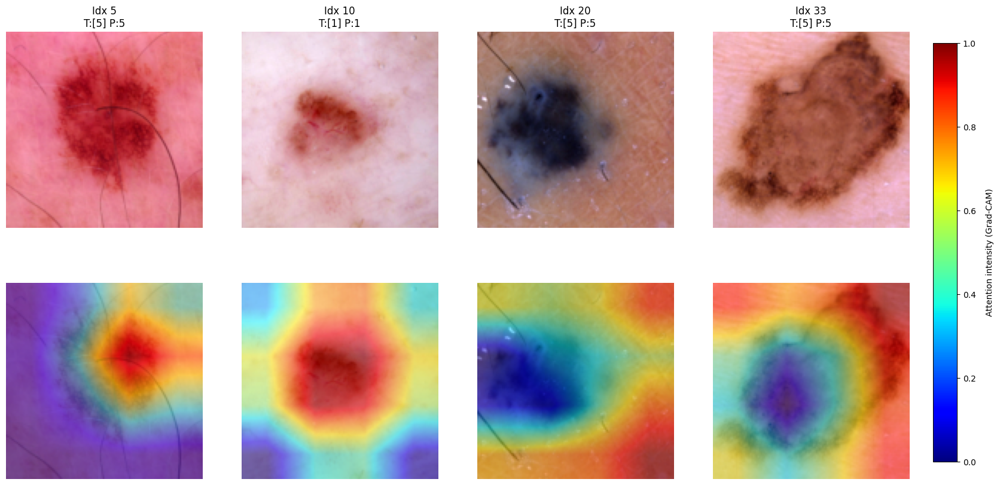

128, unweighted, ResNet50, nan


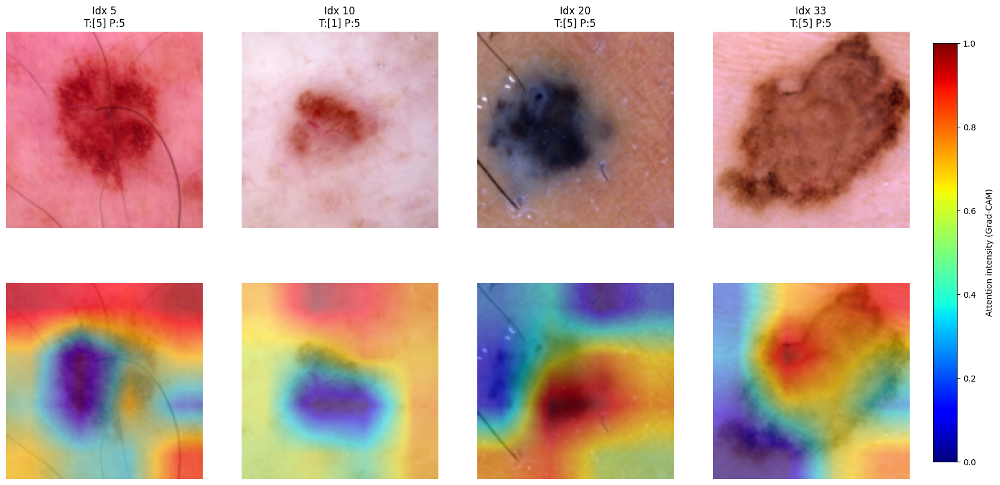

128, weighted, ResNet18, nan


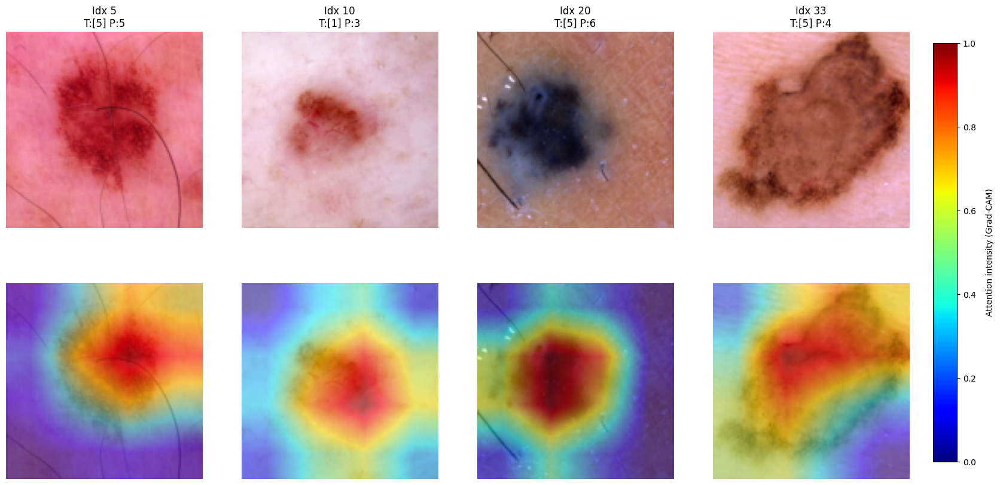

128, weighted, ResNet50, nan


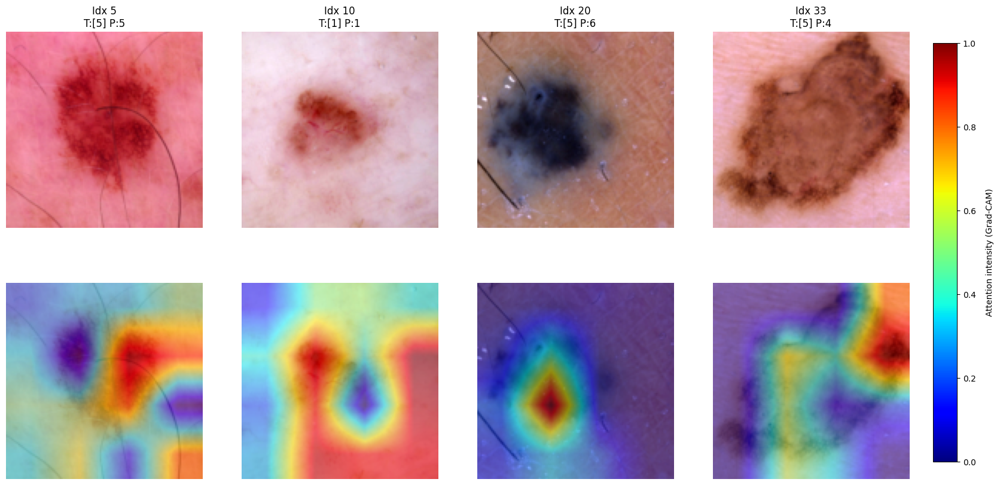

64, unweighted, ResNet18, 0.001


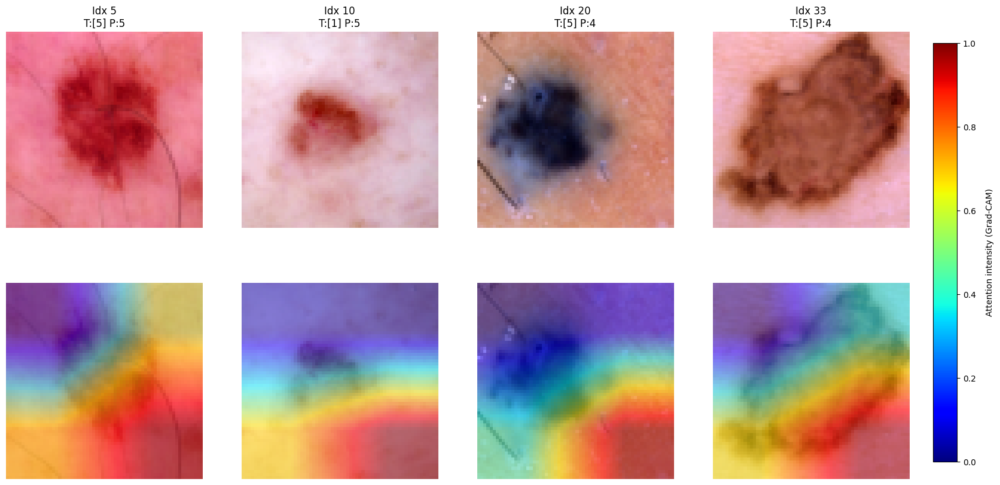

64, unweighted, ResNet18, 0.0001


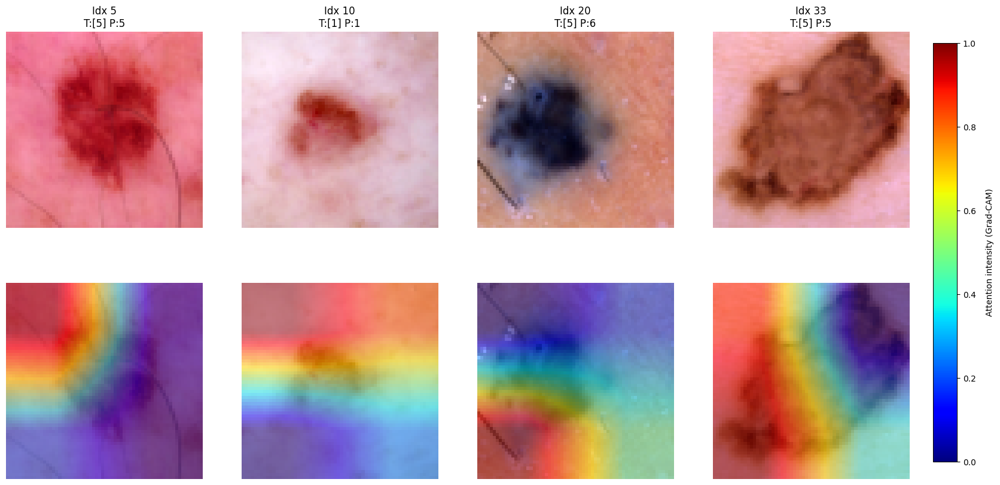

64, unweighted, ResNet50, 0.001


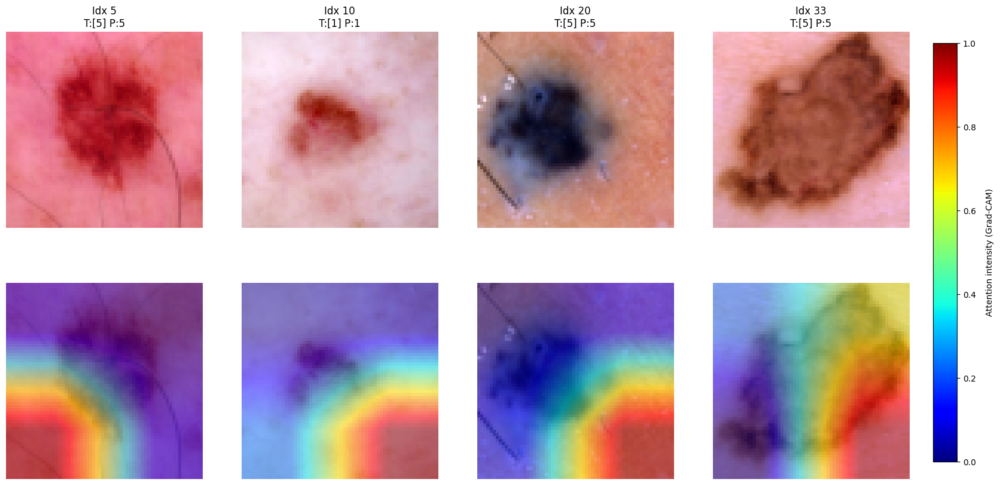

64, unweighted, ResNet50, 0.0001


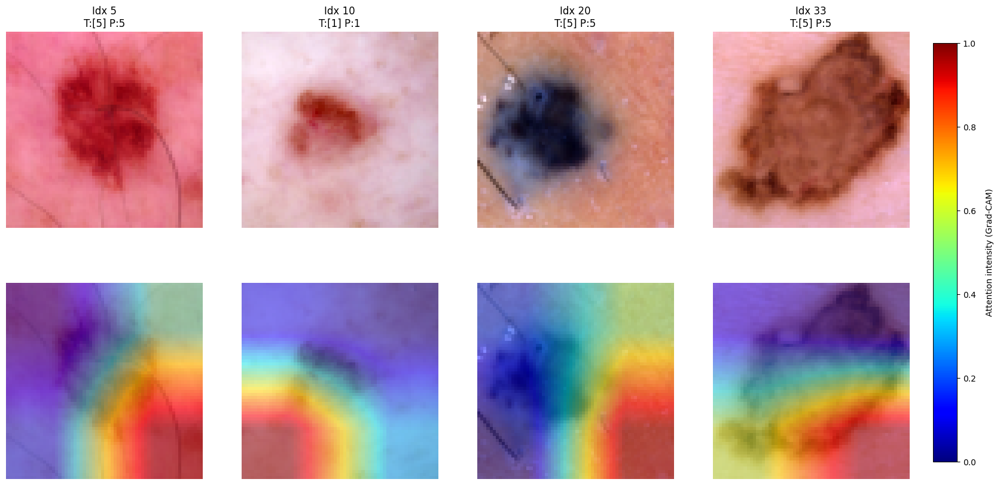

64, weighted, ResNet18, 0.001


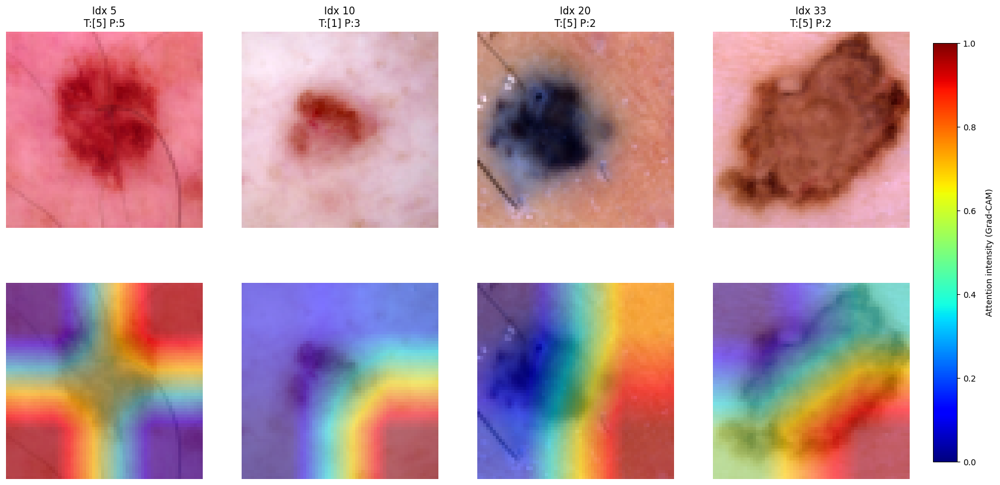

64, weighted, ResNet18, 0.0001


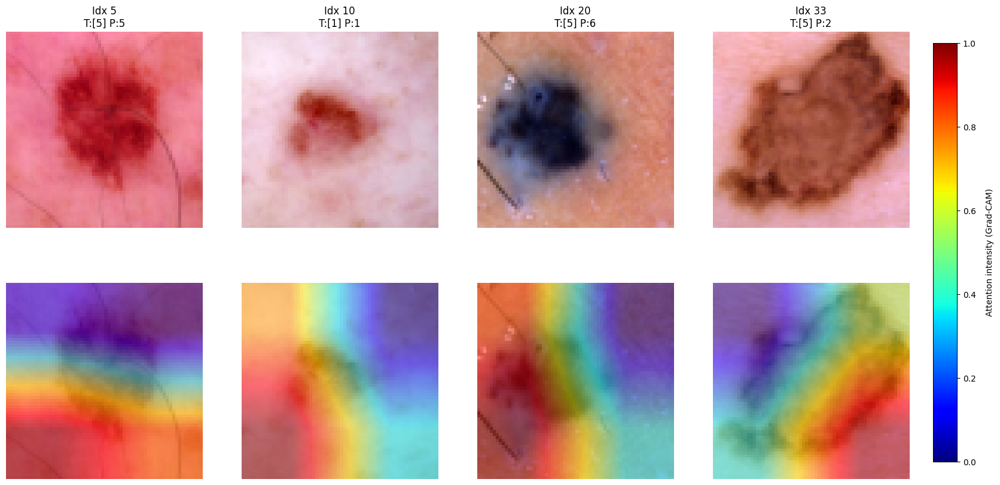

64, weighted, ResNet50, 0.001


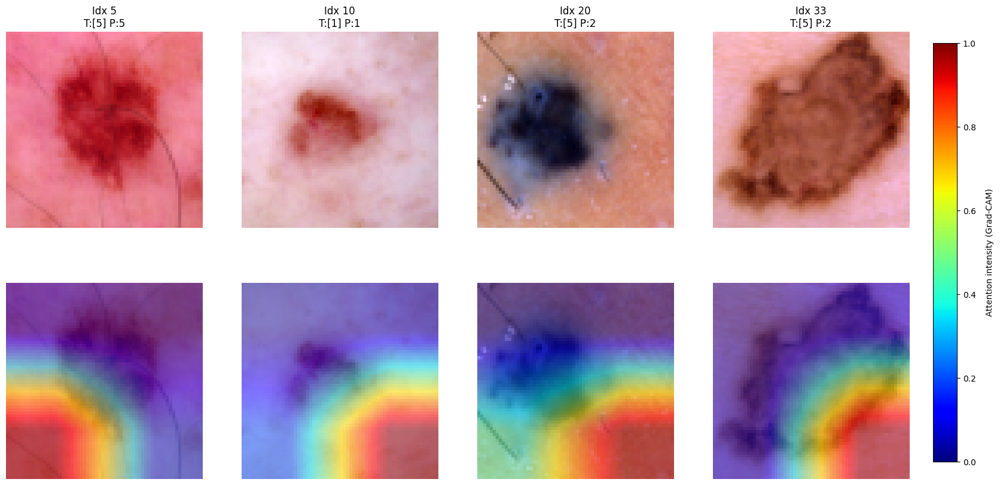

64, weighted, ResNet50, 0.0001


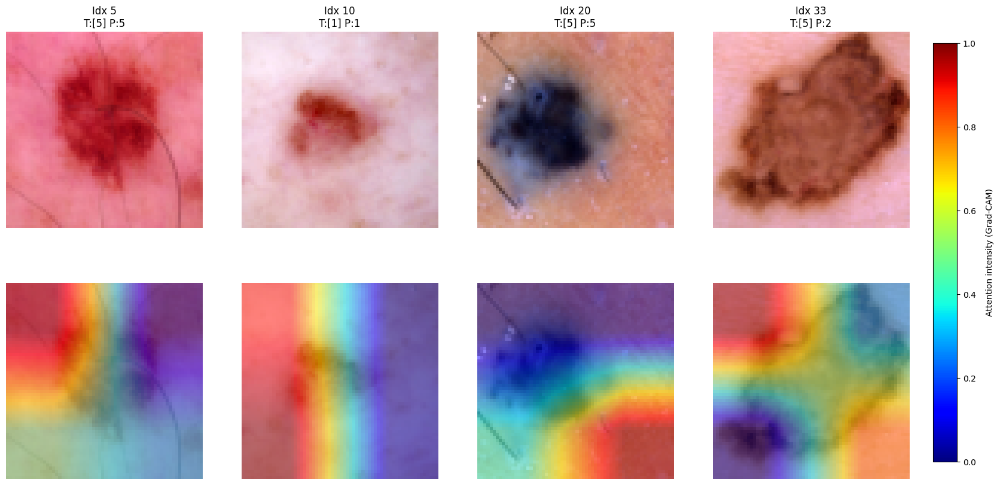

128, unweighted, ResNet18, 0.001


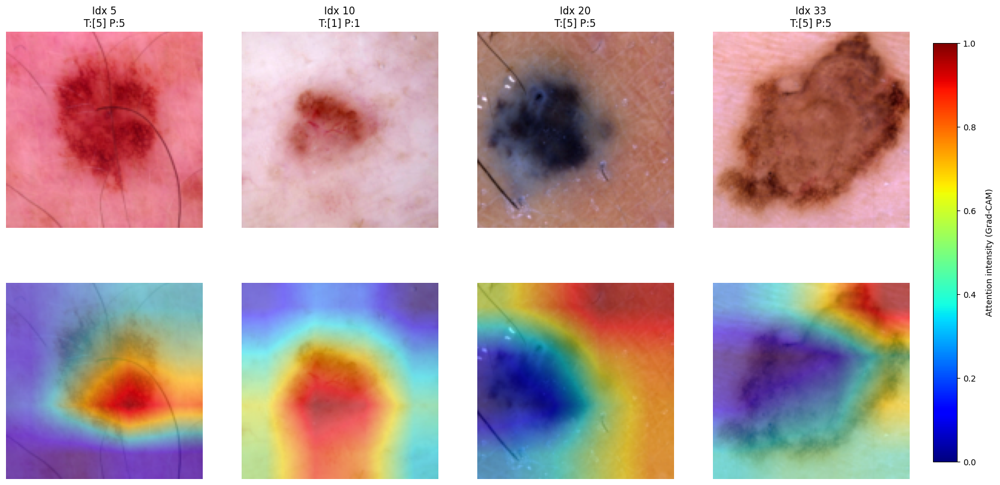

128, unweighted, ResNet18, 0.0001


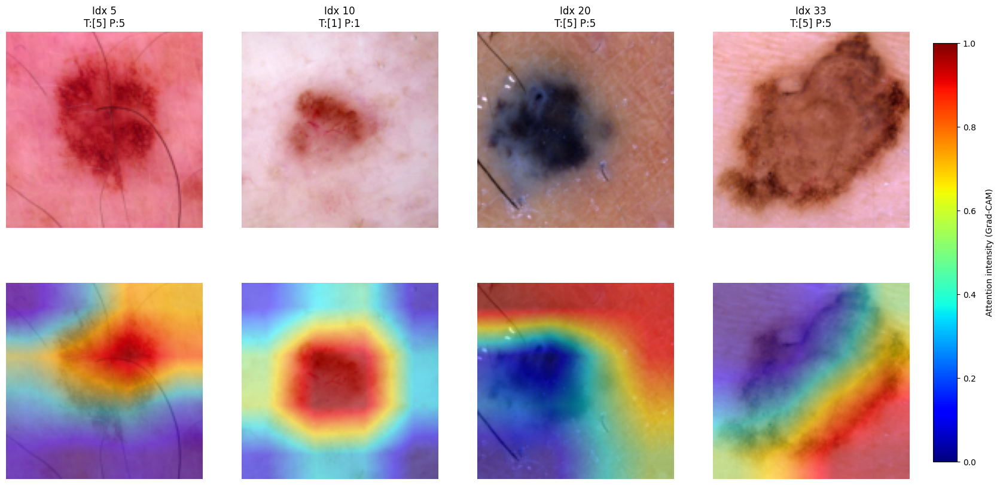

128, unweighted, ResNet50, 0.001


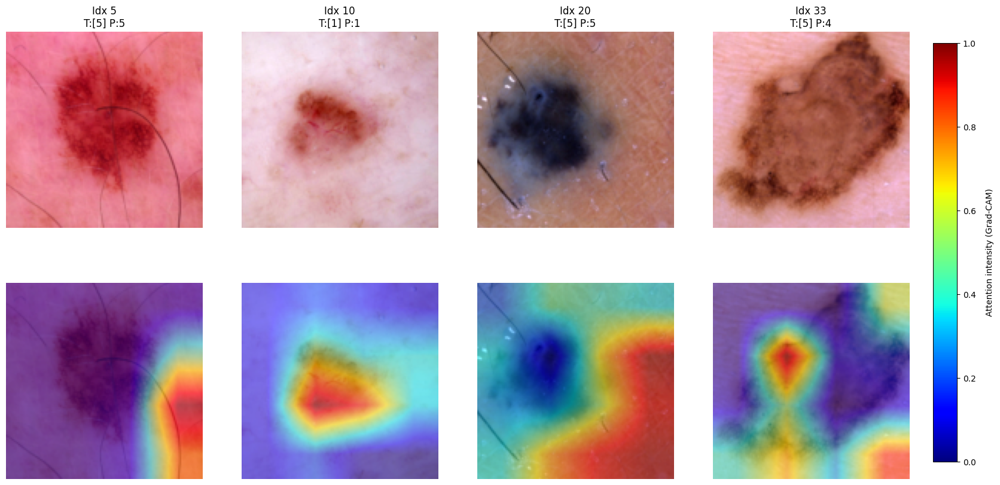

128, unweighted, ResNet50, 0.0001


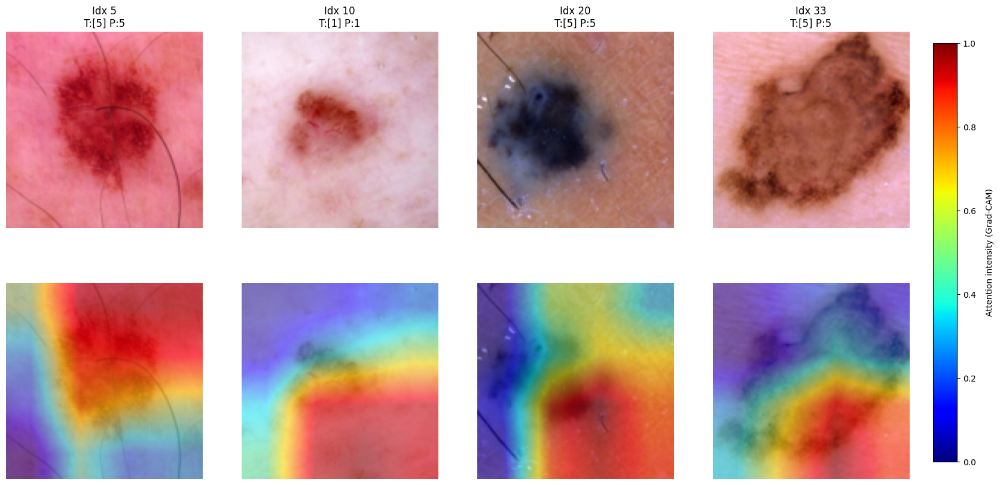

128, weighted, ResNet18, 0.001


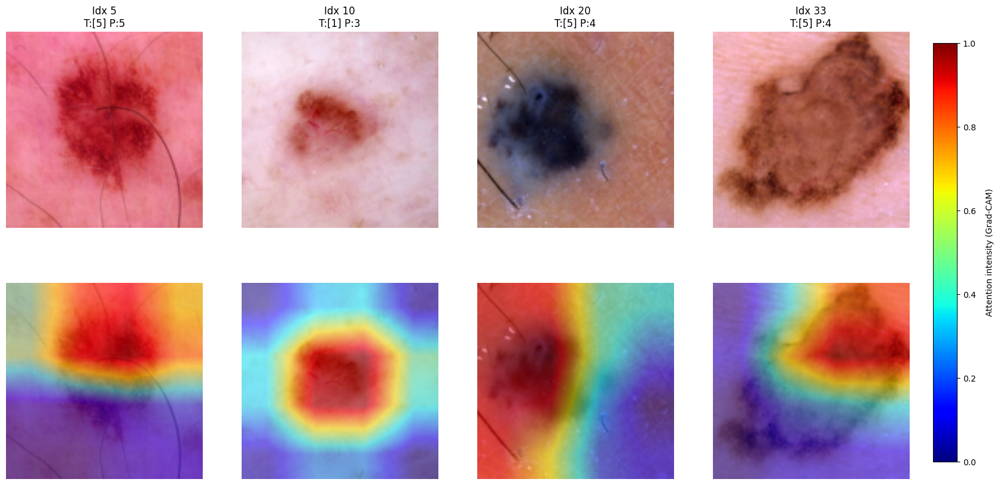

128, weighted, ResNet18, 0.0001


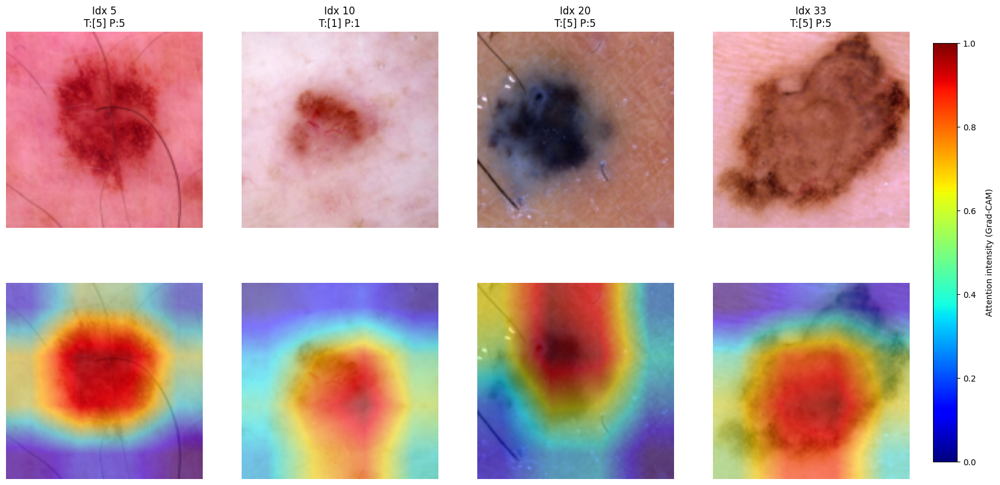

128, weighted, ResNet50, 0.001


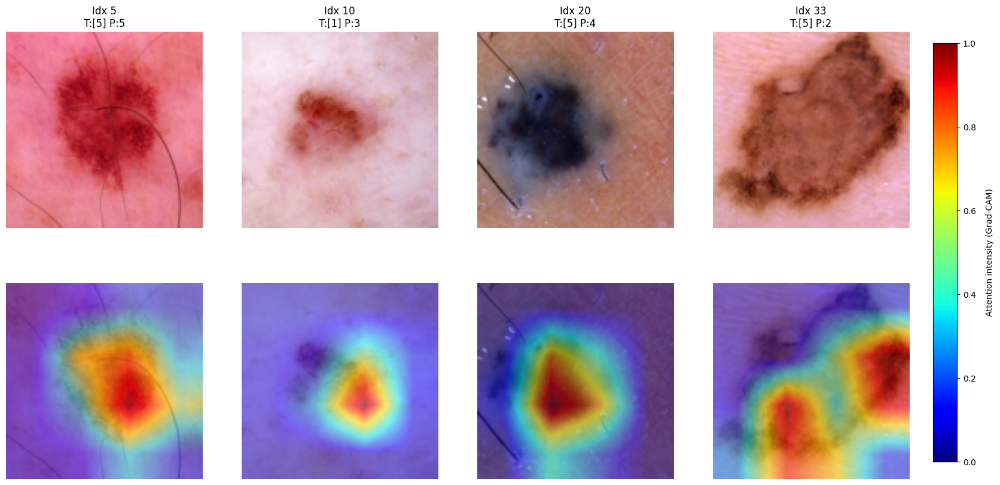

128, weighted, ResNet50, 0.0001


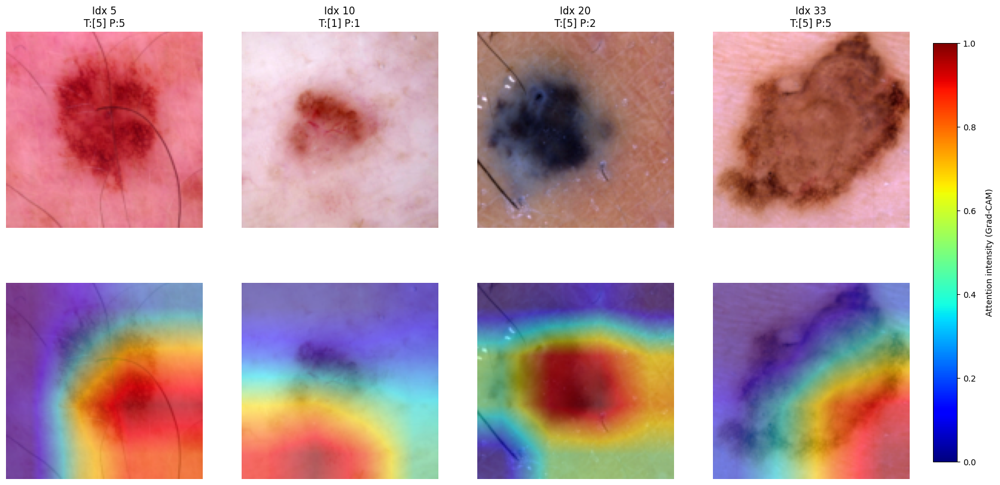

In [18]:
for row in all_results.itertuples():
    print(f"{row.img_size}, {row.loss_func}, {row.resnet}, {row.learning_rate}")
    h.run_gradcam_grid(row.model_obj, datasets_tr[row.img_size]['test'], [5, 10, 20, 33])

# h.run_gradcam_grid(resnet18_cbam, test_dataset, [5, 10, 20, 33])

# External Dataset

In [ ]:
# best model is "128, unweighted, ResNet18, NaN" (iloc 4 in all df)
# load model and weights
# AI Usage: ChatGPT just told me how to load the model from a file
final_model = h.get_resnet(18)
print(Path.cwd())
final_model.load_state_dict(torch.load(
    "128_unweighted_ResNet18_nan_model.pth", 
    map_location=torch.device('cpu')
))
final_model.eval()

/content


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [30]:
# load MedIMeta dataset
# medimeta images are 224 x 224, so need to resize to be the size of the model we are using (in this case, 128 x 128)
# AI Usage: an AI told me the above and also showed me how to code it.
EXT_IMG_SIZE = 128
ext_img_transform = transforms.Compose([
    transforms.Resize((EXT_IMG_SIZE, EXT_IMG_SIZE)),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3),
])

# AI Usage: used AI to understand how to load dataset
ext_dataset = h.TransformedMedIMeta(
    "drive/MyDrive/School/Harvard/bmi712/project/MedIMeta", 
    "derm", 
    "disease category", 
    transform=ext_img_transform,
)

len(ext_dataset)

11720

In [31]:
ext_loader = DataLoader(ext_dataset, batch_size=64, shuffle=False)

In [32]:
for images, labels in ext_loader:
    print(images.size())
    print(labels.size())
    print(labels)
    break

torch.Size([64, 3, 128, 128])
torch.Size([64])
tensor([1, 1, 1, 1, 0, 1, 4, 0, 1, 0, 1, 1, 5, 1, 1, 1, 1, 0, 4, 1, 1, 1, 1, 3,
        5, 2, 2, 0, 1, 1, 4, 4, 4, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 0, 1, 1,
        1, 1, 1, 1, 4, 1, 2, 1, 1, 1, 1, 1, 1, 0, 1, 1])


In [33]:
# evaluate model on loader
print(f"Accuracy: {h.evaluate(final_model, ext_loader, device=device)}")
print(f"AUC: {h.compute_auc_multiclass(final_model, ext_loader)}")

Accuracy: 0.1106655290102389
AUC: 0.6354796890611782
